<a href="https://colab.research.google.com/github/Blurr99/Dog-Vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end Multi-class image classifier using Tensorflow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

The beed of a dog can be identifiyig by using a picture of them.
## 2. Data

The data being used is from Kaggle's dog breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* Each data record is an image (unstructured data) so, deep learning/ transfer learning is preferred.

* There are 120 breeds of dogs (this means there are 120 different classes).

* There are around 10,000+ images in the training set.
  (these images have labels)

* There are around 10,000+ images, in the test set.
  (these images have no labels so they can be predicted)

In [ ]:
from google.colab import drive
drive.mount('drive')

Mounted at drive


### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure GPU is being used.

In [ ]:
# Import necessary tools
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "Not Available")

TF version: 2.13.0
TF Hub version:  0.14.0
GPU available


## Getting data ready (turning into Tensors)

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

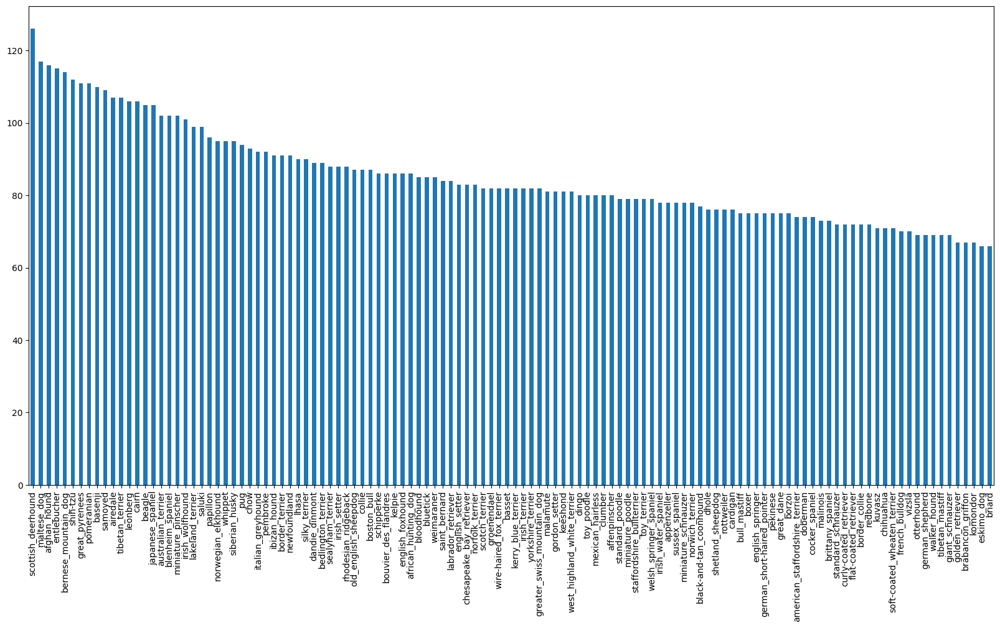

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

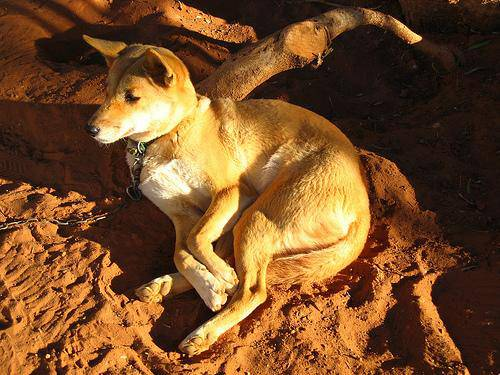

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
len(labels_csv["id"])

10222

In [ ]:
import os
filenames = [ "drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
print(len(filenames))

10222


In [ ]:
# Check whether number of filenames matches number of actual image files

if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files received")
else:
  print("Filenames do not match actual amount of files")

Filenames match actual amount of files received


In [ ]:
filenames[:5]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

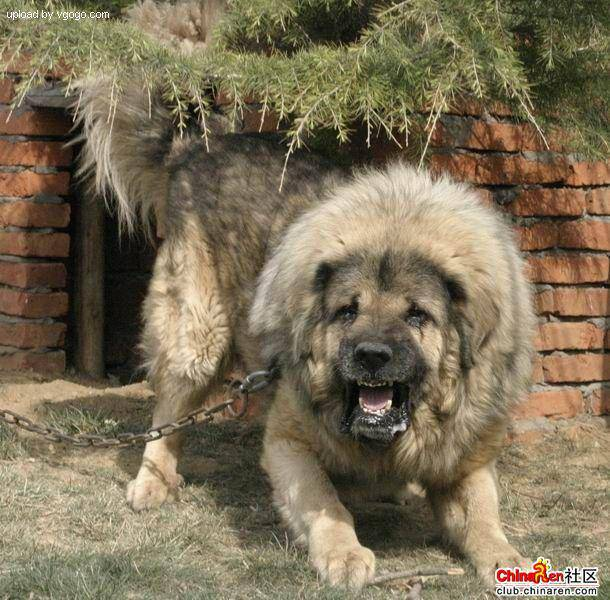

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since, now all the training image filepaths are in a list, preparing the labels

In [ ]:
import numpy as np

labels  = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does't matches number of filenames!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique labels
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

### Creating validation set
Since the dataset from Kaggle doesn't come with a validation set.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

Starting off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min: 1000, max: 10000, step: 1000}

In [ ]:
# Splitting the data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train),  len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (turning images into Tensors)

To preprocess images into Tensors, the function needs to do a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the filepath and save it to a variable, `image`.
3. Turn the `image` (a jpg) into Tensors
4. Normalize the image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return modified `image`

In [ ]:
# Convert an image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# Turn image into a tensor
tf.constant(image) [:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
    Takes an image filepath and turns the image into a Tensor
  """
  # Read an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (244,244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning images into batches

In [ ]:
# Create a simple function to return a tuple of Tensors
def get_image_label(image_path, label):
  """
    Takes an image file path and the associated label,
    processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now theres a way to turn the data into tuples of Tensors in the form: `(image, label)`. Creating function to turn all of the data (`X` & `y`) into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data=False):
  """
    Creates bathes of data out of an image (X) and label(y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (No labels).
  """
  # If the data is the test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it

  elif valid_data:
    print("Creating valid data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training batches...
Creating valid data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

The data is now in batches, however, these can be a little hard to understand/comprehend, so creating a function to visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
    Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(12,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lins off
    plt.axis("off")

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

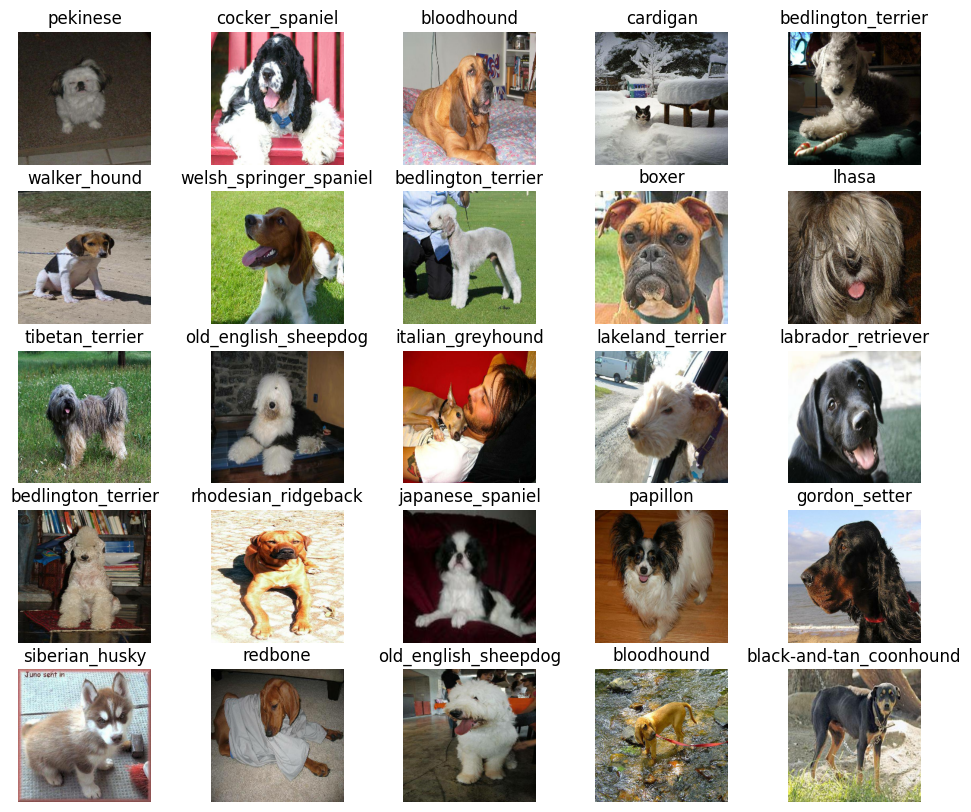

In [ ]:
# Visualizing the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

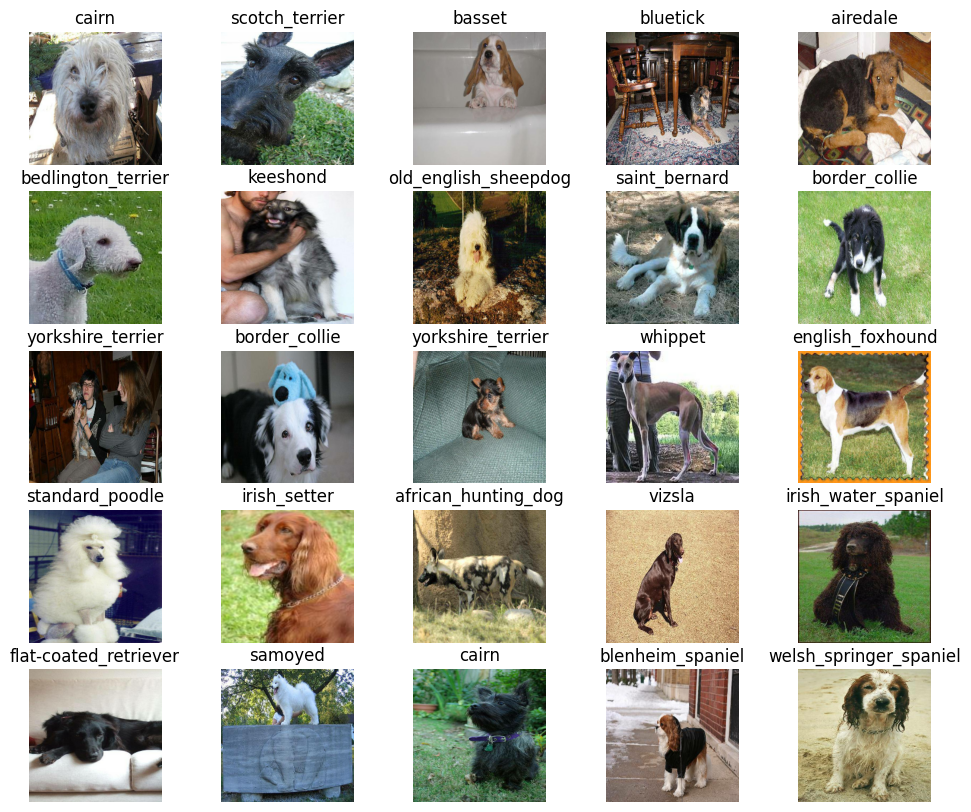

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before building a model, there are a few things to define:
* The input shape(images shape, in the form of tensors) to the model.
* The output shape (image labels in the form of tensors) to the model.
* The URL of the model from TensorFlow Hub -
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup out put shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Creating a function which:
* Takes input shape, output shape and the chosen model as parameters.
* Defines the layes in the Keras model in a sequential fashion.
* Compiles the model (says its should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.
All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with: ", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url),  # Layer 1 (input layer)
      tf.keras.layers.Dense(units=output_shape,
                            activation="softmax")   # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalFocalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track the model's progress and another for early stopping which prevents the model from training for too long.

### TensorBoard callback

To setup a TensorBoard callback, 3 things to be done:
1. Load the TensorBoard notebook extention
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the model's `fit()` function.
3. Visualize the model's training logs with the `tensorboard` magic function (after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

The first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available" if tf.config.list_logical_devices("GPU") else "not available")

GPU available


Creating a function which trains a model

* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback`.
* Call the `fit()` function on our model passing it the training data, validation data, the number of epochs to train for (`NUM_EPOCHS`) and the callbacks to use.
* Return the model.

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
    Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 160s 6s/step - loss: 1.0950 - accuracy: 0.1063 - val_loss: 0.7781 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 3s 131ms/step - loss: 0.2871 - accuracy: 0.6975 - val_loss: 0.4378 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 3s 136ms/step - loss: 0.0543 - accuracy: 0.9425 - val_loss: 0.3327 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 3s 109ms/step - loss: 0.0124 - accuracy: 0.9950 - val_loss: 0.3059 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 3s 116ms/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 0.2961 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 3s 112ms/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 0.2921 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 82ms/step


array([[1.0271614e-03, 1.1225236e-04, 9.0694666e-04, ..., 1.3559952e-04,
        1.5994160e-04, 7.1822610e-03],
       [3.8452386e-03, 1.3751944e-03, 1.2635563e-03, ..., 5.7211414e-04,
        6.6289044e-04, 4.2889416e-04],
       [1.1657050e-04, 3.2001373e-04, 6.3140801e-04, ..., 2.3061369e-04,
        1.3797545e-03, 1.4388628e-03],
       ...,
       [4.6682280e-06, 2.1153402e-04, 2.5225821e-04, ..., 3.7721038e-05,
        9.0582570e-04, 3.9720809e-04],
       [2.5229130e-03, 5.5829698e-04, 1.1808590e-04, ..., 3.8024707e-04,
        1.3343319e-04, 8.7454366e-03],
       [1.2824080e-04, 2.6442669e-04, 1.1860031e-03, ..., 5.3038835e-03,
        2.2330790e-04, 1.5712527e-04]], dtype=float32)

In [ ]:
unique_breeds[predictions[0].argmax()]

'border_terrier'

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[9.32151510e-04 1.17587519e-03 1.99009199e-04 9.76528216e-04
 9.28493217e-03 3.41277831e-04 5.54867263e-04 4.29524295e-03
 6.28139824e-02 1.83711499e-01 8.48438212e-05 1.19291995e-04
 2.56877602e-03 7.54785910e-03 2.91219843e-03 3.33615905e-03
 2.03987758e-04 8.18876550e-04 4.60407085e-04 1.05644832e-03
 1.42314675e-04 1.44461624e-03 6.50045986e-04 7.71967811e-04
 7.05546960e-02 1.44527352e-03 8.32434278e-04 7.20005832e-04
 9.92591842e-04 9.78290336e-05 1.47067258e-04 3.52777657e-04
 5.05912700e-04 2.45401054e-04 1.11362059e-03 7.31420761e-04
 2.16249202e-04 2.36028369e-04 1.01203186e-04 1.65823787e-01
 2.19110749e-04 7.40500982e-05 1.02075860e-02 1.63389064e-04
 3.09533236e-04 8.75547412e-05 4.43629280e-04 3.71052395e-03
 1.24824117e-04 1.13506289e-03 2.03585150e-04 6.97145879e-05
 1.09789521e-03 3.39937094e-03 1.33037465e-04 1.07237196e-03
 1.48361025e-03 1.13626287e-04 8.66113187e-05 3.12484393e-04
 1.12663154e-04 1.09210354e-03 9.91051085e-04 3.65340675e-04
 2.53818900e-04 2.838794

In [ ]:
unique_breeds[np.argmax(y_val[42])]

'english_foxhound'

Creating a function to get the labels for a number of images at a time.


In [ ]:
# Turn prediction probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
    Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

NameError: ignored

Now since the validation data is still in a batch dataset, they need to be converted back to make predictions on the validation images and then compare those predictions on the validation labels(truth labels)

In [ ]:
# Create a function to unbatch a batch dataset
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Function to unbatch
def unbatchify(data):
  """
    Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now there are ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Creating a function to visualize everything.

* Creating a function that takes an array of truth labels and an array of images and integer.
* Convert the predicted probabilities to a predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
    View the prediction, the ground label and image for the sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format (pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                     color = color)


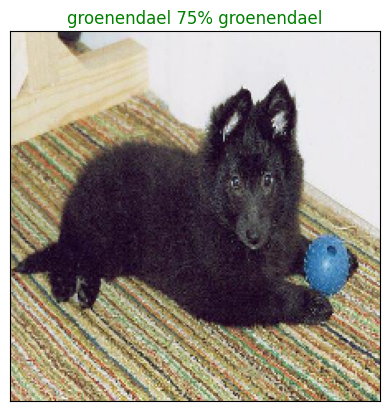

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n = 77)

Now theres a function to visualize the models top prediction, making another function to view our models top 10 predictions.

This function will:
* Take an input of the prediction probabilities array and a ground truth array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values andf labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
    Plot the top 10 highest prediction confidences along with the truth label for sample n,
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 17,  26,  59, 103,   6,  70, 109,  35,  68,  79])

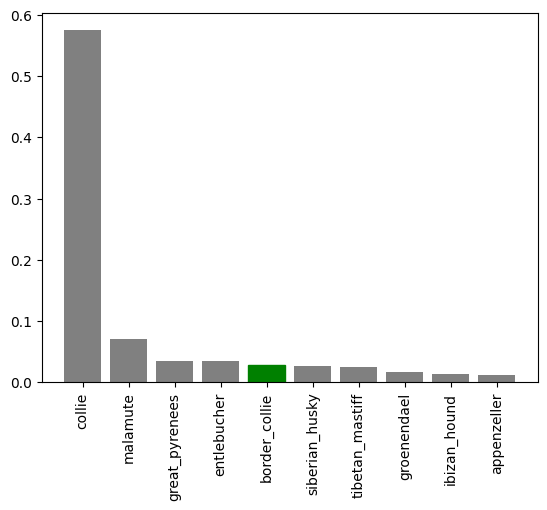

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n = 9)

Now there are some functions to help visualize the predictions and evaluate the model, checking a few more predictions.

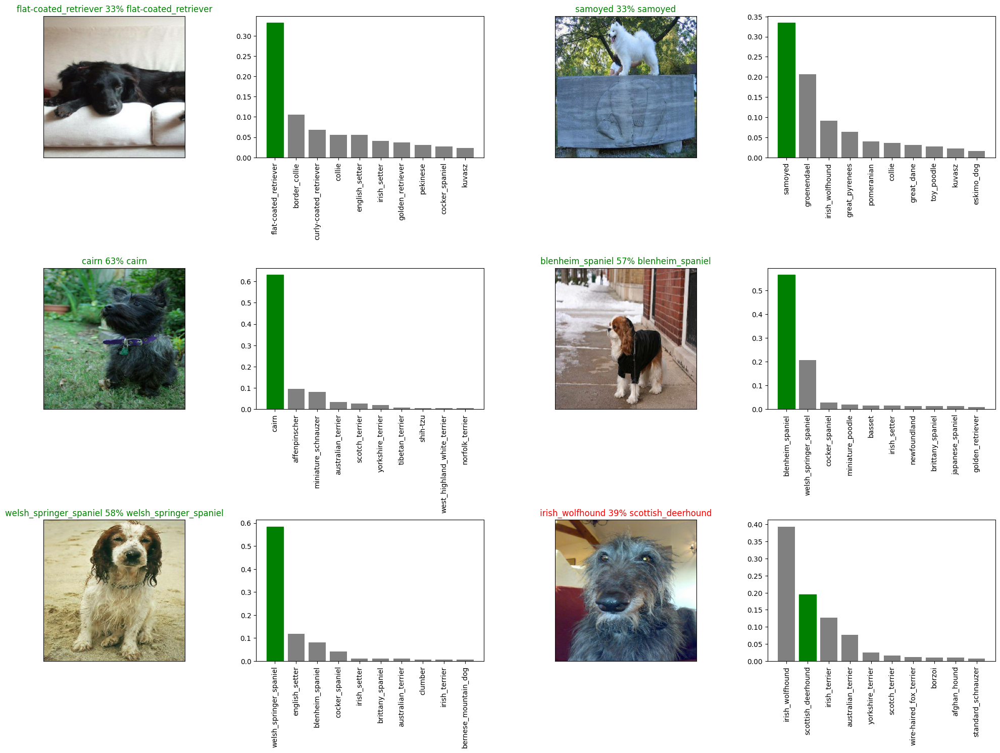

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(mode, suffix = None):
  """
    Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format for model
  print(f"Saving to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
    Loads a saved model from a specified path.
  """
  print(f"Loading saved model: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})

  return model

In [ ]:
# Save our model trained on a 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving to : drive/MyDrive/Dog Vision/models/20230910-13511694353894-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20230910-13511694353894-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20230910-05591694325576-1000-images-mobilenetv2-Adam.h5')

Loading saved model: drive/MyDrive/Dog Vision/models/20230910-05591694325576-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 77ms/step - loss: 0.2738 - accuracy: 0.6300


[0.2738302946090698, 0.6299999952316284]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 69ms/step - loss: 0.2848 - accuracy: 0.6050


[0.2847989499568939, 0.6050000190734863]

## Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note:** Running the cell below will take a little while
(maybe upto 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks  = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 34s 92ms/step - loss: 0.2710 - accuracy: 0.6592
Epoch 2/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0568 - accuracy: 0.8756
Epoch 3/100
320/320 [==============================] - 29s 91ms/step - loss: 0.0255 - accuracy: 0.9316
Epoch 4/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0126 - accuracy: 0.9639
Epoch 5/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0070 - accuracy: 0.9806
Epoch 6/100
320/320 [==============================] - 31s 95ms/step - loss: 0.0041 - accuracy: 0.9887
Epoch 7/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0033 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 30s 92ms/step - loss: 0.0023 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 29s 91ms/step - loss: 0.0020 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 29s 90ms/step - l

In [ ]:
save_model(full_model, suffix="full-image-mobilenetv2-Adam")

Saving to : drive/MyDrive/Dog Vision/models/20230910-14161694355365-full-image-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20230910-14161694355365-full-image-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20230910-14161694355365-full-image-mobilenetv2-Adam.h5")

Loading saved model: drive/MyDrive/Dog Vision/models/20230910-14161694355365-full-image-mobilenetv2-Adam.h5


## Making prediction on the test dataset

Since the model has been trained on images in the form of Tensor batches, to make predictions on the test dat, the input has to be in the same format.

The function `create_data_batches()` created earlier can be used to take a list of filenames as input and convert them into Tensor batches.

To make predictions on test data:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make predictions array by passing the test data batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e807c4b5025b0aa4dcbd5df2765aa8e4.jpg',
 'drive/MyDrive/Dog Vision/test/e7afb35b8252782013a6700e28e327fa.jpg',
 'drive/MyDrive/Dog Vision/test/e78d3997b4e7f4abc1299f81b8e3b2d9.jpg',
 'drive/MyDrive/Dog Vision/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'drive/MyDrive/Dog Vision/test/e7a1b7a42db97df750aeae212a02d9c4.jpg',
 'drive/MyDrive/Dog Vision/test/e783e22d4f370b6cc0b1f44b4d6584a8.jpg',
 'drive/MyDrive/Dog Vision/test/e823ee1ca007c88600806925a6f2bce1.jpg',
 'drive/MyDrive/Dog Vision/test/e816f0027a2c6348dbf12b79c70541bc.jpg',
 'drive/MyDrive/Dog Vision/test/e850770a6575a34b1c7ad4b401692553.jpg',
 'drive/MyDrive/Dog Vision/test/e7b608110b0e29120d8740f37e85f3d0.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to  run.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 3676s 11s/step


In [ ]:
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
loaded_test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions[:10]

array([[4.9775396e-04, 1.9826107e-03, 5.7912618e-04, ..., 4.6071610e-03,
        2.1716804e-04, 5.1430547e-05],
       [6.8242929e-04, 1.3183506e-04, 1.5577381e-03, ..., 4.2119422e-03,
        2.9346105e-02, 3.4635272e-04],
       [2.2492064e-04, 7.4850672e-05, 2.3079501e-03, ..., 8.5134525e-03,
        3.7929928e-04, 1.7632772e-03],
       ...,
       [8.5257115e-03, 9.7291311e-04, 6.2530678e-05, ..., 3.4407558e-04,
        5.5337255e-04, 3.5834484e-02],
       [3.2972917e-04, 2.9866377e-02, 3.2657964e-04, ..., 6.8557874e-04,
        9.4905766e-03, 9.2403032e-04],
       [5.5358009e-03, 7.4354053e-04, 5.7109213e-04, ..., 3.9145339e-04,
        1.4000048e-04, 2.4572338e-03]], dtype=float32)

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission:
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the doig breed's column.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog Vision/test/e807c4b5025b0aa4dcbd5df2765aa8e4', '.jpg')

In [ ]:
# Append test image ID's to predictions DFataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e807c4b5025b0aa4dcbd5df2765aa8e4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7afb35b8252782013a6700e28e327fa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e78d3997b4e7f4abc1299f81b8e3b2d9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7feb64da6aae1ef8e62453f6660d0c5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7a1b7a42db97df750aeae212a02d9c4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
 # Add the prediction probabilities to each dog breed column
 preds_df[list(unique_breeds)] = test_predictions
 preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e807c4b5025b0aa4dcbd5df2765aa8e4,0.000498,0.001983,0.000579,0.000192,0.004958,0.000117,0.000036,0.002118,0.002073,...,0.000778,0.000052,0.000526,0.001249,0.000101,0.014491,0.000146,0.004607,0.000217,0.000051
1,e7afb35b8252782013a6700e28e327fa,0.000682,0.000132,0.001558,0.030568,0.000465,0.000135,0.001083,0.001346,0.000209,...,0.012554,0.005256,0.004073,0.001434,0.000870,0.002880,0.008157,0.004212,0.029346,0.000346
2,e78d3997b4e7f4abc1299f81b8e3b2d9,0.000225,0.000075,0.002308,0.000214,0.001642,0.000274,0.003301,0.053632,0.001201,...,0.005685,0.048323,0.000031,0.001411,0.000297,0.000097,0.003971,0.008513,0.000379,0.001763
3,e7feb64da6aae1ef8e62453f6660d0c5,0.003402,0.017425,0.000275,0.002938,0.000237,0.000552,0.001232,0.010222,0.000567,...,0.016809,0.000921,0.004308,0.004690,0.000178,0.001130,0.001082,0.001527,0.000097,0.001906
4,e7a1b7a42db97df750aeae212a02d9c4,0.000654,0.000458,0.000050,0.000797,0.000575,0.000118,0.000451,0.000055,0.000164,...,0.000061,0.000328,0.000301,0.000083,0.000323,0.000531,0.015204,0.000042,0.003407,0.001509


In [ ]:
# Save our predictions dataFrame to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index = False)

## Making predictions on custom images

To make predictions on custom images:
* Get the filepaths of custom images
* Turn the filepaths into data batches using `create_data_batches()`. And since  custom images won't have labels,  the `test_data` parameter will be set to `True`.
* Pass the custom image data batch to the model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/IMG20230904091113.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG20230903193505.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG20230819093637.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG20230812174338.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG20230627173153.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG-20230910-WA0047.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG-20230910-WA0051.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG20230501155941.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG-20230910-WA0048.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG-20230910-WA0052.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/gs.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/sh.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 912ms/step


In [ ]:
custom_preds

array([[8.06122145e-04, 6.15928136e-03, 7.56218942e-05, ...,
        5.08599402e-03, 8.04667361e-03, 6.04429340e-04],
       [5.08927915e-05, 1.81131368e-03, 3.81934294e-03, ...,
        1.05125131e-03, 3.06278840e-03, 9.91187524e-04],
       [2.09626487e-05, 7.62454118e-04, 2.01847474e-03, ...,
        4.05891724e-02, 1.08910247e-03, 2.42474971e-06],
       ...,
       [5.68194839e-04, 2.94834637e-04, 1.15455034e-04, ...,
        1.32773081e-02, 2.42020178e-04, 3.48584697e-04],
       [7.48385256e-03, 5.66705363e-03, 2.54107150e-03, ...,
        2.02023308e-03, 9.62940045e-03, 7.67278252e-03],
       [4.87129873e-04, 2.26875325e-03, 2.53881328e-03, ...,
        1.58839580e-02, 6.38932409e-03, 3.29063623e-04]], dtype=float32)

In [ ]:
custom_preds.shape

(12, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['border_terrier',
 'chesapeake_bay_retriever',
 'kuvasz',
 'siberian_husky',
 'leonberg',
 'american_staffordshire_terrier',
 'english_setter',
 'cardigan',
 'great_pyrenees',
 'great_pyrenees',
 'german_shepherd',
 'siberian_husky']

In [ ]:
# Get custom images (our batchify() function won't work since there aren't labels)
custom_images = []
# Loop through the unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

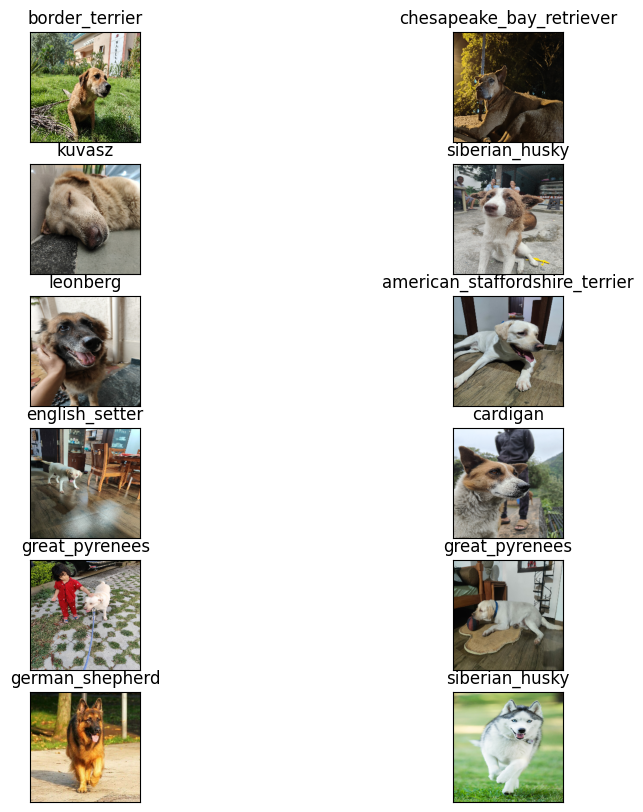

In [ ]:
# Check custom image predictions
plt.figure(figsize = (10,10))
for i, image in enumerate(custom_images):
  plt.subplot(6, 2, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)